# This CODE is heavily inspired by this tutorial on Youtube

# https://www.youtube.com/watch?v=JFWqCQHg-Hs

# Impoting Libraries

In [1]:
import numpy as np

In [2]:
import matplotlib.pyplot as plt

In [3]:
from moviepy.video.io.ImageSequenceClip import ImageSequenceClip

# Frequency to save the solution

In [4]:
plot_freq = 50

# Function to calculate distance

In [5]:
def distance(x_1,y_1,x_2,y_2):
    return np.sqrt(((x_1-x_2)**2)+((y_1-y_2)**2))

# D2Q9

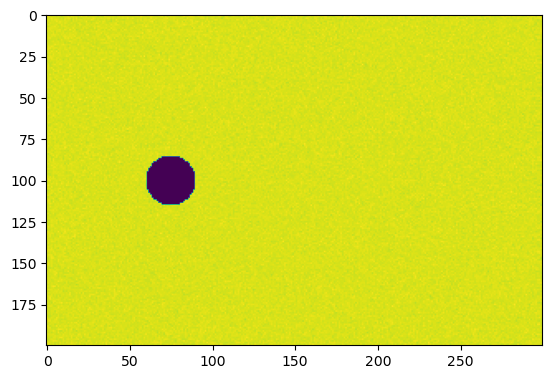

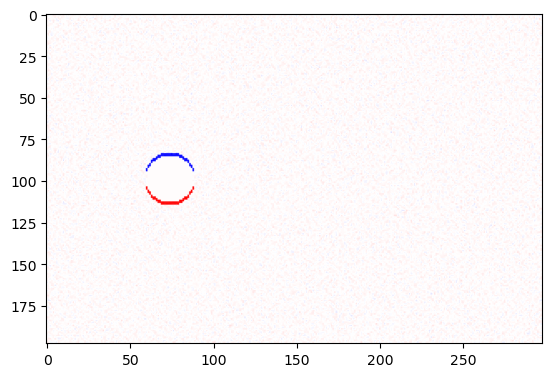

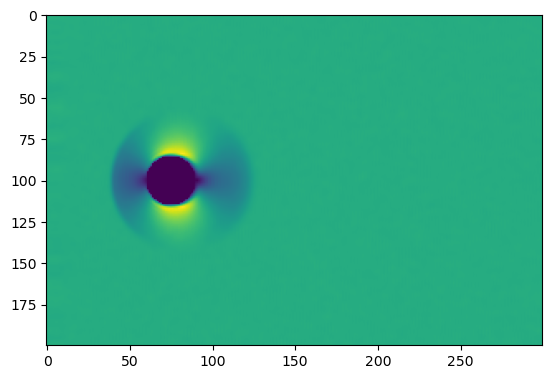

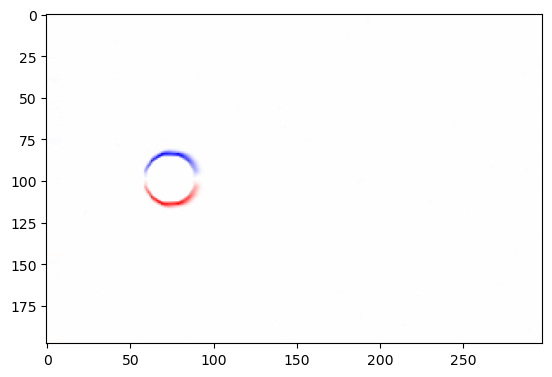

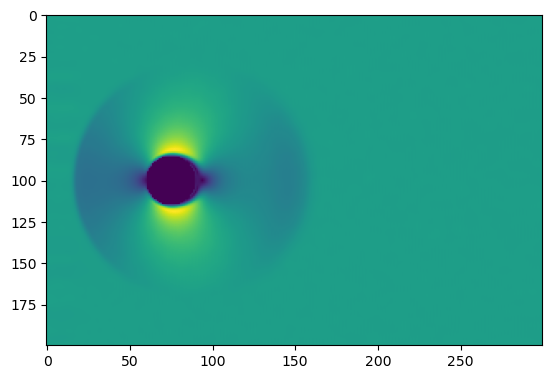

...

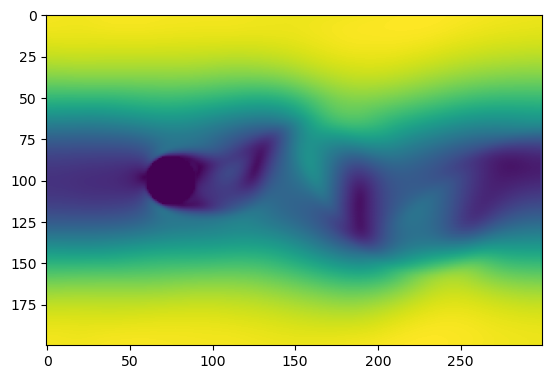

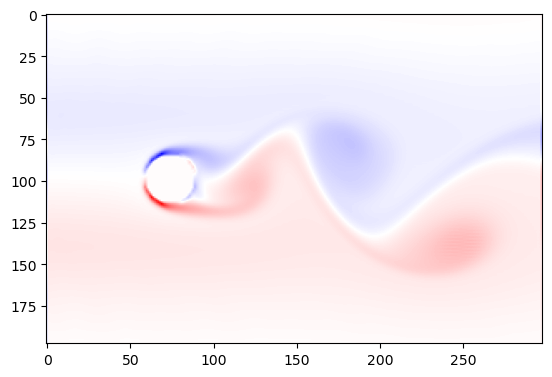

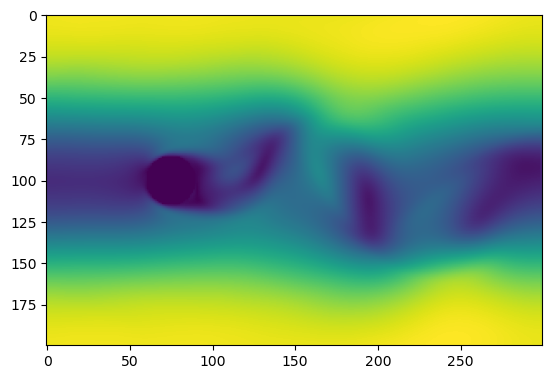

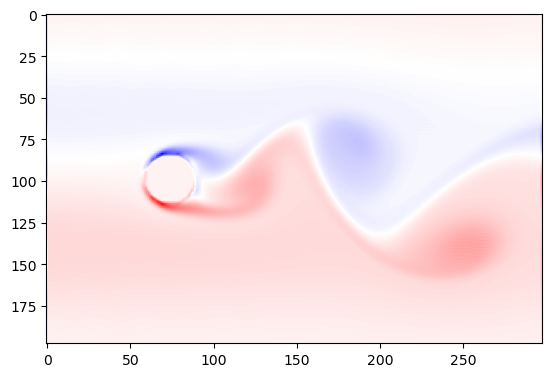

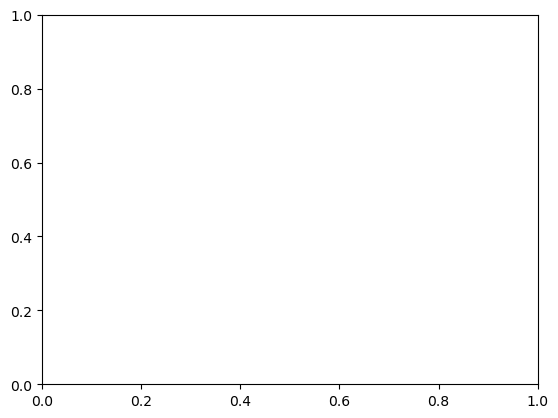

In [7]:
Nx = 200
Ny = 300

# Kinematic viscosity
nu = 0.55

# Number of the iterations
Nt = 5000

# Lattice speeds and weights
NL = 9
cxs = np.array([0,0,1,1,1,0,-1,-1,-1])
cys = np.array([0,1,1,0,-1,-1,-1,0,1])
weights = np.array([4/9,1/9,1/36,1/9,1/36,1/9,1/36,1/9,1/36])

# Initial Conditions
F = np.ones((Nx,Ny,NL)) + (0.01*np.random.randn(Nx,Ny,NL))
F[:,:,3] = 2.5

cylinder = np.full((Nx,Ny),False)

for y in range(0,Ny):
    for x in range(0,Nx):
        if (distance(Nx//2,Ny//4,x,y) < 15):
            cylinder[x][y] = True

vel_img_list = []
curl_img_list = []

# main loop
for it in range(Nt):
    # print(it)
    
    F[:,-1,[6,7,8]] = F[:,-2,[6,7,8]]
    F[:,0,[2,3,4]] = F[:,1,[2,3,4]]

    for i,cx,cy in zip(range(NL),cxs,cys):
        F[:,:,i] = np.roll(F[:,:,i],cx,axis =1)
        F[:,:,i] = np.roll(F[:,:,i],cy,axis =0)

    boundary_F = F[cylinder,:]
    boundary_F = boundary_F[:,[0,5,6,7,8,1,2,3,4]]

    # Fluid variables
    rho = np.sum(F,2)
    u_x = np.sum(F*cxs,2)/rho
    u_y = np.sum(F*cys,2)/rho

    F[cylinder,:] = boundary_F
    u_x[cylinder] = 0
    u_y[cylinder] = 0

    # Collision

    Feq = np.zeros(F.shape)
    for i,cx,cy,w in zip(range(NL),cxs,cys,weights):
        Feq[:,:,i] = rho*w*(
            1 + 3 * (cx*u_x +cy*u_y) + 9 * (cx*u_x +cy*u_y)**2 / 2 - 3 * (u_x**2 + u_y**2) / 2
        )

    F = F - ((1/nu)*(F-Feq))

    if (it % plot_freq == 0):
        # Velocity plots
        plt.imshow(np.sqrt(u_x**2 + u_y**2))
        plt.savefig(f"Vel_{it}.png")
        vel_img_list.append(f"Vel_{it}.png")
        plt.pause(0.01)
        plt.cla()
        
        # Curl plots
        dfydx = u_x[2:,1:-1] - u_x[0:-2,1:-1]
        dfxdy = u_y[1:-1,2:] - u_y[1:-1,0:-2]
        curl = dfydx -dfxdy
        plt.imshow(curl,cmap="bwr")
        plt.savefig(f"Curl_{it}.png")
        curl_img_list.append(f"Curl_{it}.png")
        plt.pause(0.01)
        plt.cla()

In [8]:
animation = ImageSequenceClip(vel_img_list, fps = 10)
animation.write_videofile(f"Movie_vel.mp4")

Moviepy - Building video Movie_vel.mp4.
Moviepy - Writing video Movie_vel.mp4



Moviepy - Done !
Moviepy - video ready Movie_vel.mp4


In [9]:
animation = ImageSequenceClip(curl_img_list, fps = 10)
animation.write_videofile(f"Movie_curl.mp4")

Moviepy - Building video Movie_curl.mp4.
Moviepy - Writing video Movie_curl.mp4



Moviepy - Done !
Moviepy - video ready Movie_curl.mp4


In [10]:
! rm *.png